### Imports

In [1]:
%load_ext autoreload
%autoreload 2
import sys
import platform
from pathlib import Path
from os import environ
if platform.system() == "Darwin": # Nat laptop
    sys.path.extend(['/Users/nkinsky/Documents/UM/GitHub/NeuroPy'])
    sys.path.extend(['/Users/nkinsky/Documents/UM/GitHub/sleep_deprivation/DataPaths/'])
    plot_dir = Path("/Users/nkinsky/Documents/UM/Working/Bapun_Data/plots")
else:
    if environ["HOSTNAME"] == "lnx00004": # Nat Linux computer
        sys.path.extend(['/data/GitHub/NeuroPy'])
        sys.path.extend(['/data/GitHub/sleep_loss_hippocampal_replay/analysis_and_figure_code/DataPaths'])
        plot_dir = Path('/data/Clustering/plots')
    else:  #BG computer
        sys.path.extend(['/home/nkinsky/Documents/GitHub/NeuroPy'])
        sys.path.extend(['/home/nkinsky/Documents/GitHubPrivate/pythonprogs/DataPaths/'])
    
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import scipy.signal as sg
import matplotlib.pyplot as plt
from neuropy.utils.mathutil import min_max_scaler
from scipy.ndimage import gaussian_filter1d, gaussian_filter
from copy import deepcopy

from neuropy import plotting
from neuropy.analyses.placefields import Pf1D
from neuropy.analyses.oscillations import detect_theta_epochs
from neuropy.core.position import Position
from neuropy.core.epoch import Epoch
from neuropy.plotting import plot_ratemap
from neuropy.plotting.figure import Fig
from neuropy.utils.misc import flatten
from neuropy.io import BinarysignalIO


import subjects

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

### Visualize running behavior for all rats and tally lap #s by hand

In [2]:
#1st # = maze trials, 2nd # = remaze trial, 2 trials = 1 lap up/down
ntrials_dict = {"RatUDay2": [25, 17], "RatVDay1": [23, 30], "RatVDay3": [163, 103],
                "RatSDay3": [23, 16], "RatUDay1": [54, 4], "RatUDay4": [32, 4],
                "RatVDay2": [79, 92], "RatRDay2": [41, 10]}
sessions = subjects.remaze_sess()[1:]  # RatSDay2NSD does not have remaze position info

/home/nkinsky/miniforge3/envs/NeuroPy/lib/python3.11/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.5.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [3]:
tshift_dict = np.load(plot_dir.parent.parent / "Clustering" / "sessions" / f"theta_speed_align_thresh_hand_vetted.npy", allow_pickle=True).item()

In [4]:
def plot_traj(sess_use, maze_name, t_shift_use, a_use):
    pos_use = getattr(sess_use, maze_name)
    pos_use_shift = deepcopy(pos_use)
    pos_use_shift.t_start = pos_use_shift.t_start + tshift_use[maze_name]
    a.plot(pos_use_shift.time, pos_use_shift.x)
    a.set_title(maze_name.upper())
    

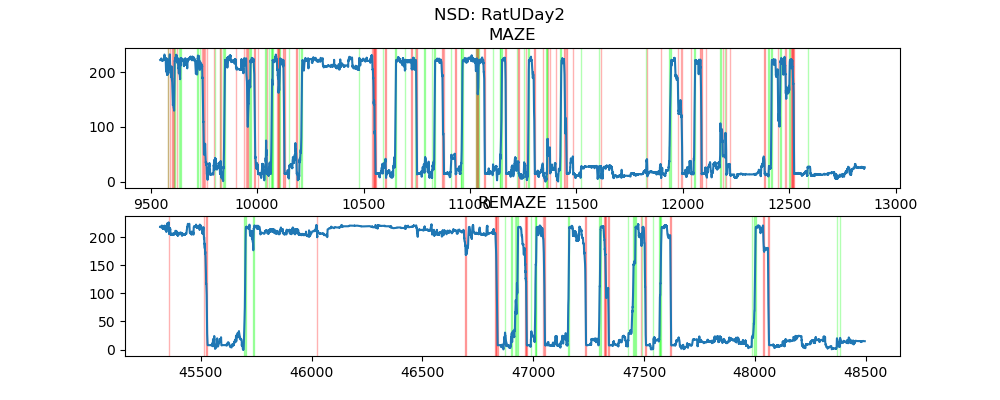

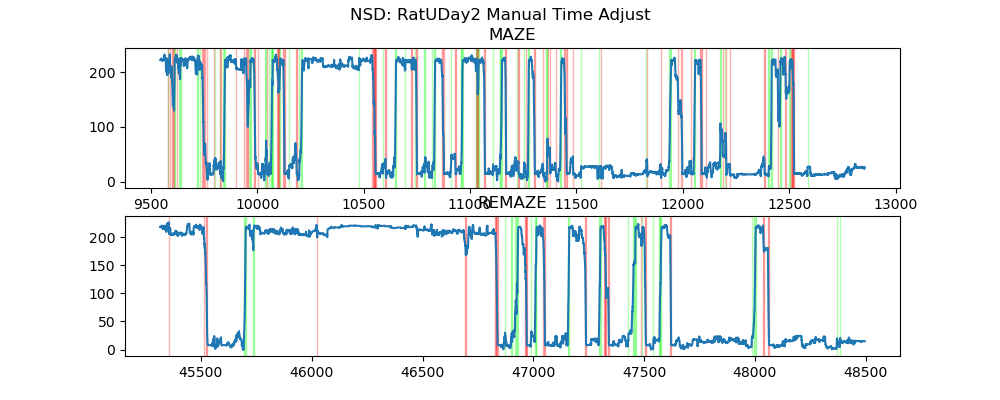

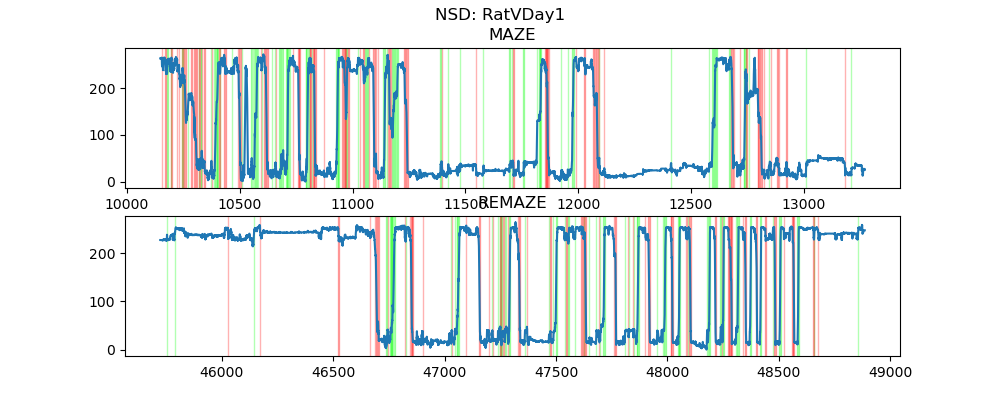

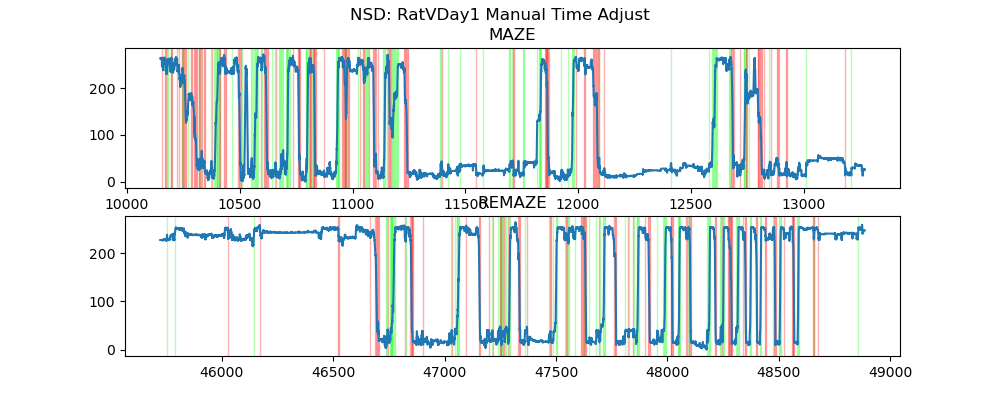

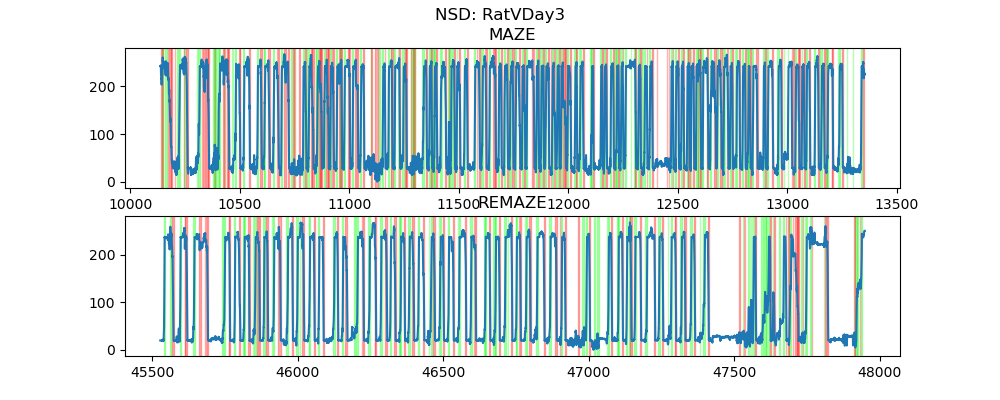

...

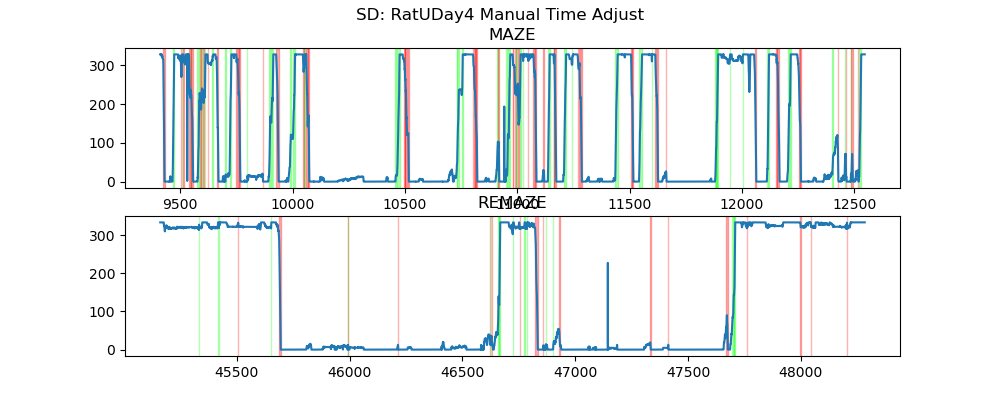

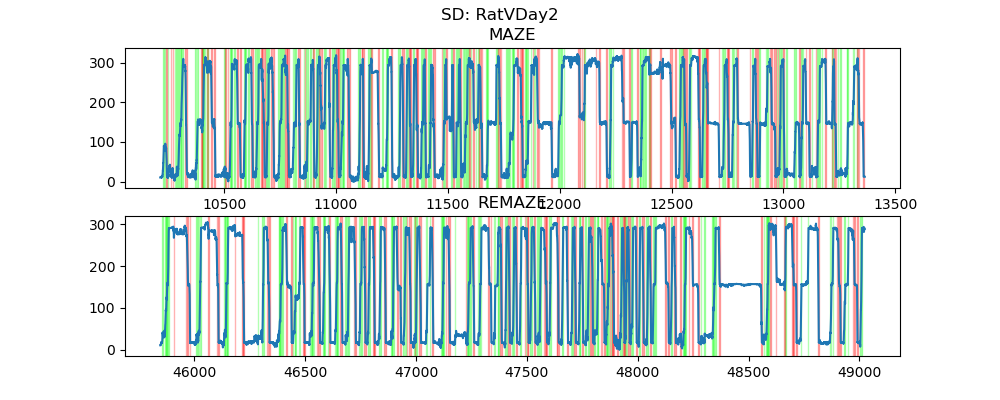

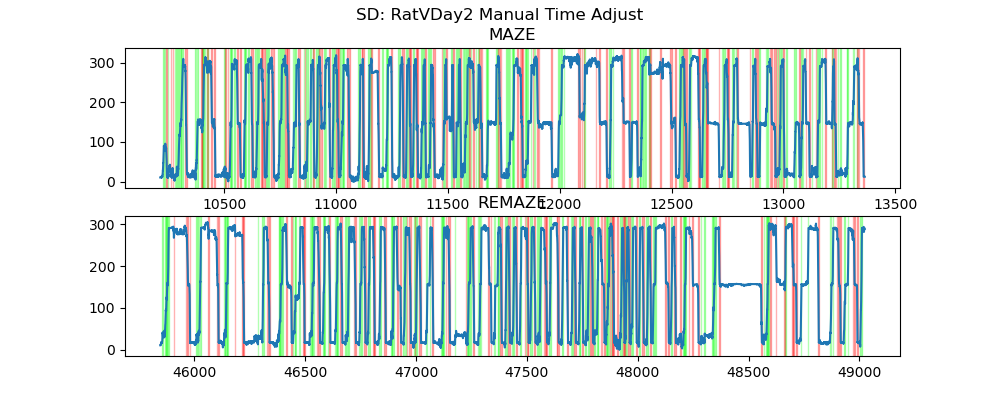

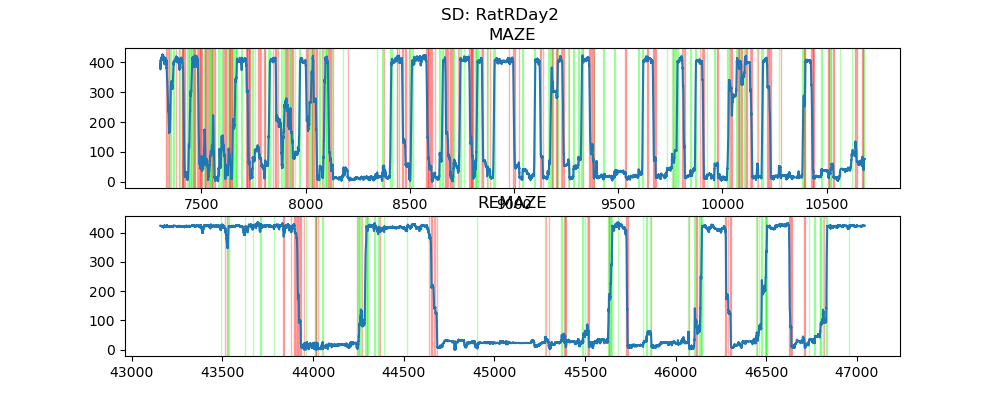

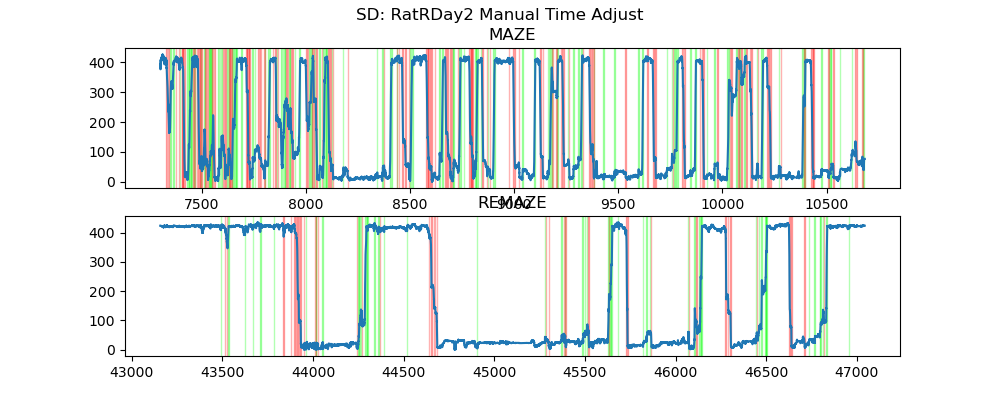

In [6]:
%matplotlib widget
for sess in subjects.remaze_sess()[1:]:
    for tshift_bool in [False, True]:
        tappend = " Manual Time Adjust" if tshift_bool else ""
        fig, ax = plt.subplots(2, 1, figsize=(10, 4))
        fig.suptitle(f"{sess.tag}: {sess.name}{tappend}")

        if tshift_bool:
            tshift_use = {"maze": tshift_dict["maze"][f"{sess.name}{sess.tag}"],
                          "remaze": tshift_dict["remaze"][f"{sess.name}{sess.tag}"]}
        else:
            tshift_use = {"maze": 0, "remaze": 0}
            
        for a, sesh_name in zip(ax, ["maze", "remaze"]):
            plot_traj(sess, sesh_name, tshift_use, a)

            run_use = getattr(sess, f"{sesh_name}_run")
            run_use = run_use.shift(tshift_use[sesh_name])
            for col, dir in zip([[0, 1, 0, 0.3], [1, 0, 0, 0.3]], ["up", "down"]):
                for start, stop in zip(run_use[dir].starts, run_use[dir].stops):
                    a.axvspan(start, stop, color=col)

#### Now plot with lick TTLs overlaid

# TODO:
1) Update pos_use below to have a time shift
2) Do the same for ripple times!

RatUDay2 9545.8048
RatUDay2 9545.8048
RatVDay1 10145.659
RatVDay1 10145.659
RatVDay3 10135.7824
Files not found for RatVDay3
RatVDay3 10135.7824
Files not found for RatVDay3
RatSDay3 10818.926933333334
RatSDay3 10818.926933333334
RatUDay1 10370.551466666666
RatUDay1 10370.551466666666
RatUDay4 9410.2016
RatUDay4 9410.2016
RatVDay2 10213.5296
RatVDay2 10213.5296
RatRDay2 7288.618666666666
RatRDay2 7288.618666666666


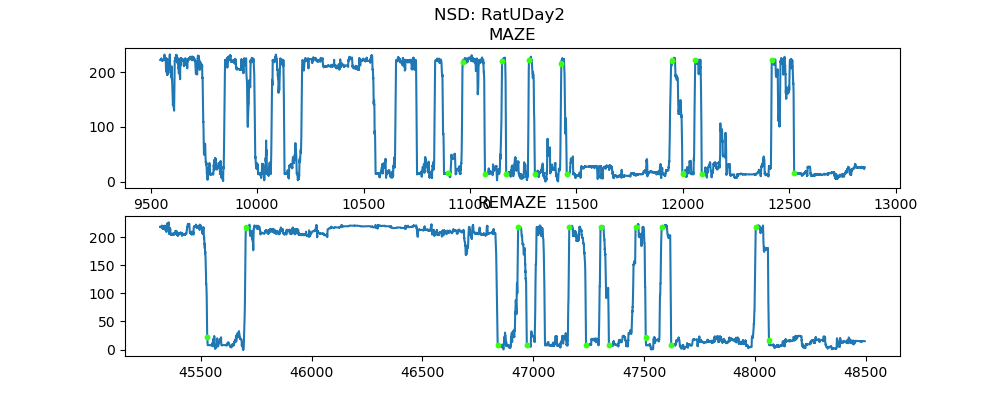

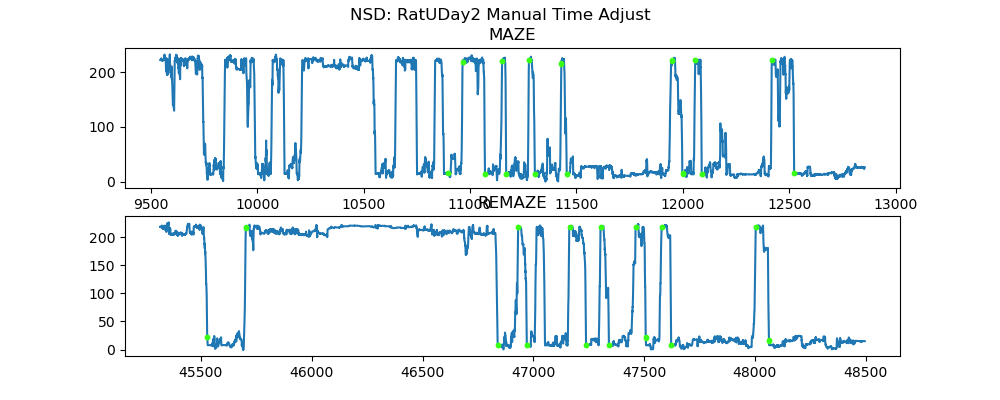

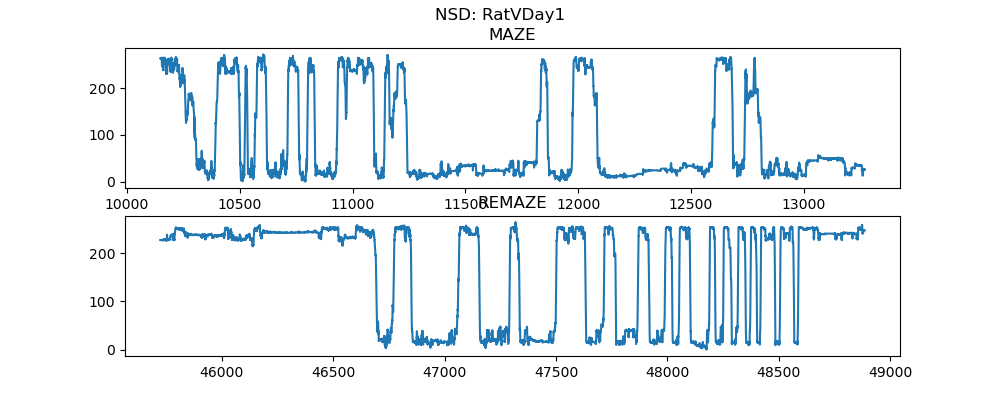

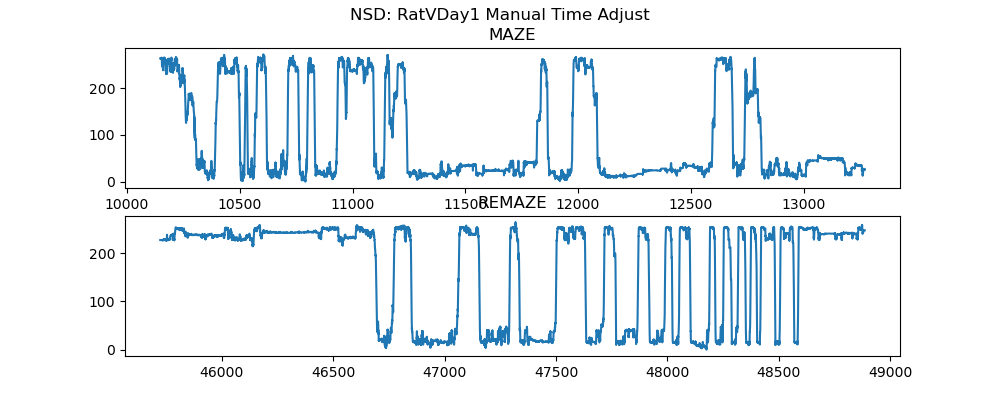

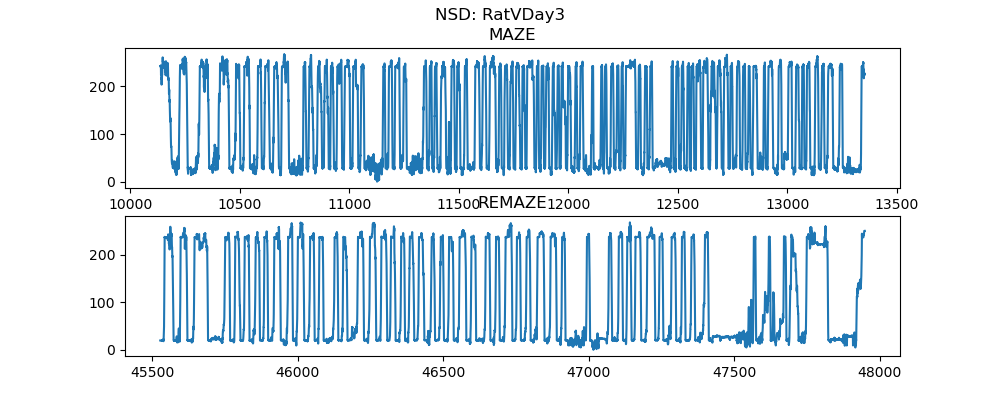

...

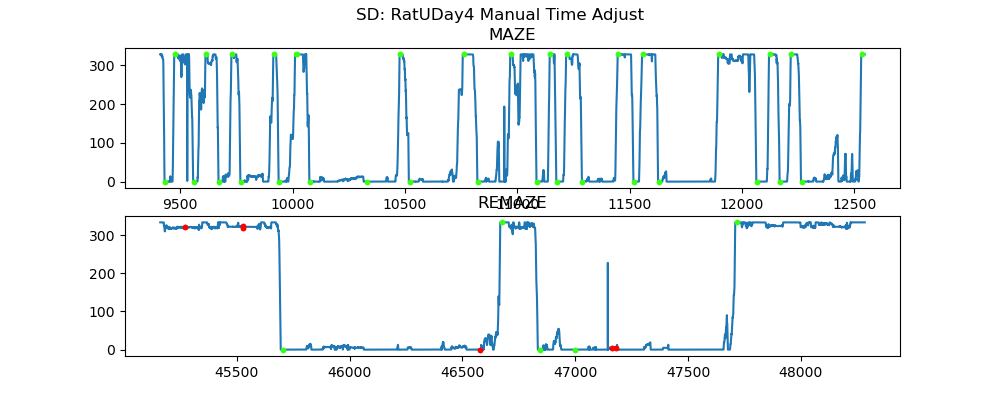

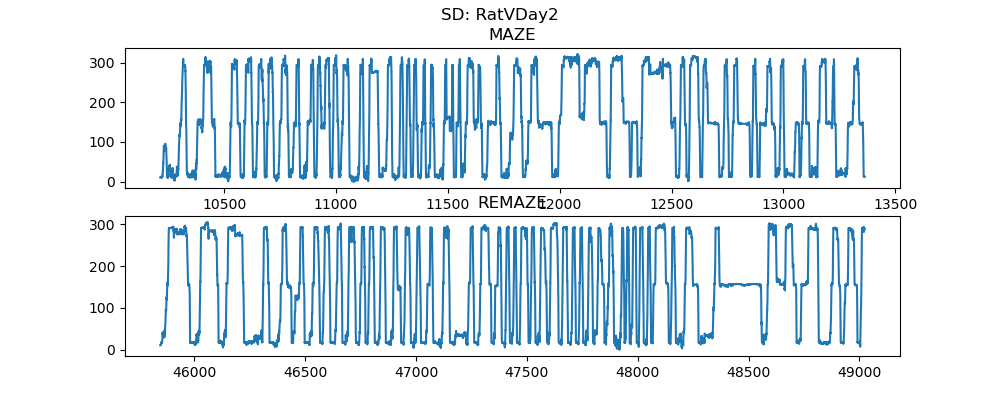

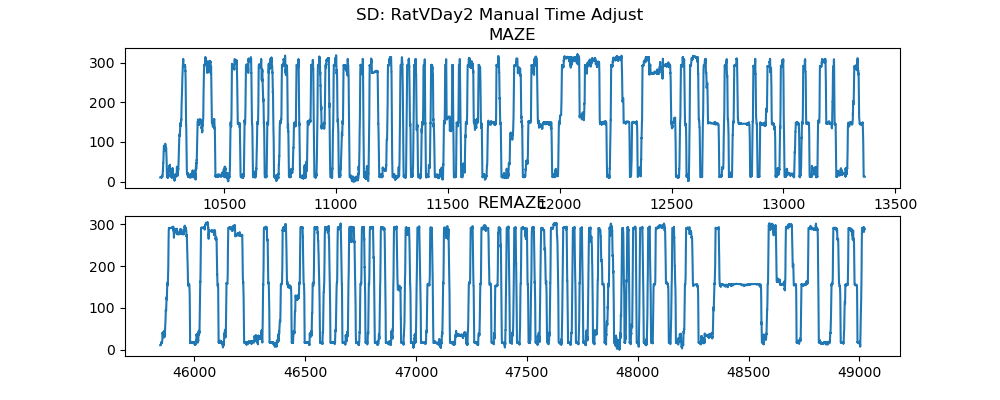

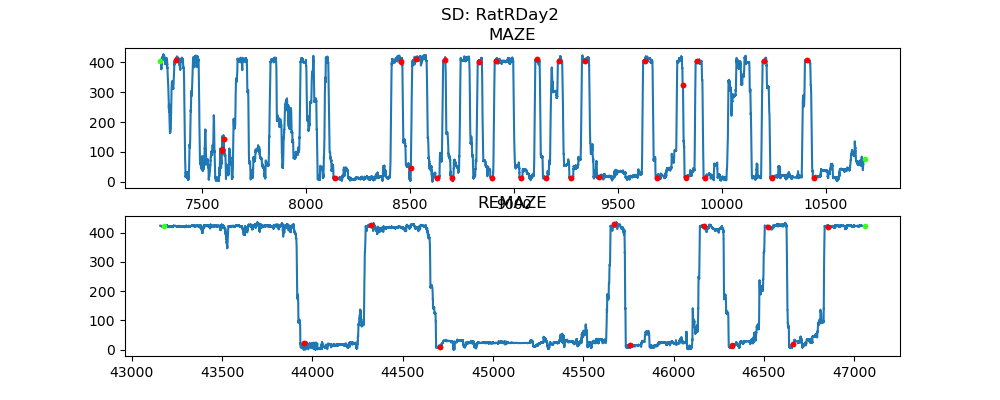

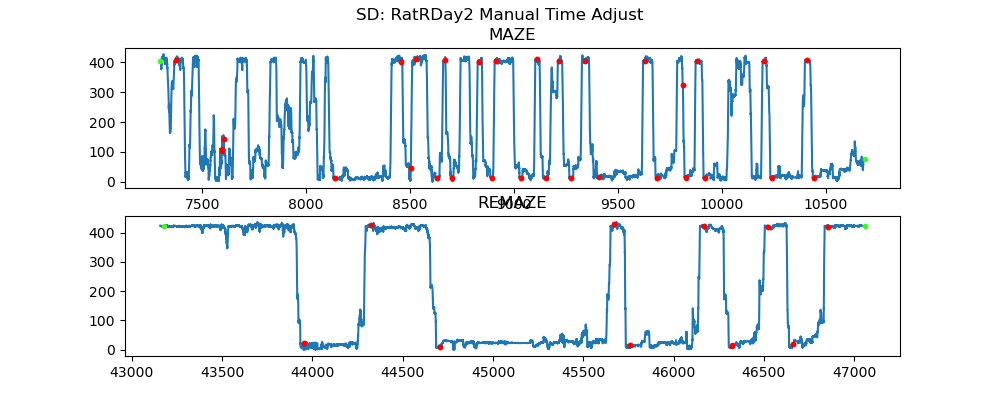

In [8]:
%matplotlib widget
for sess in subjects.remaze_sess()[1:]:
    for tshift_bool in [False, True]:
        tappend = " Manual Time Adjust" if tshift_bool else ""
        fig, ax = plt.subplots(2, 1, figsize=(10, 4))
        fig.suptitle(f"{sess.tag}: {sess.name}{tappend}")

        if tshift_bool:
            tshift_use = {"maze": tshift_dict["maze"][f"{sess.name}{sess.tag}"],
                          "remaze": tshift_dict["remaze"][f"{sess.name}{sess.tag}"]}
        else:
            tshift_use = {"maze": 0, "remaze": 0}
            
        for a, sesh_name in zip(ax, ["maze", "remaze"]):
            plot_traj(sess, sesh_name, tshift_use, a)

        # Get TTL times
        datetime_file = sorted(sess.recinfo.source_file.parent.glob("*.datetime.csv"))[0]
        datetime_df = pd.read_csv(datetime_file)
        for ids, key in enumerate(datetime_df.keys()):
            if (datetime_df[key].values.dtype == "object"):
                if np.isin(["maze"], datetime_df[key].values):
                    break
        idmaze = np.where(datetime_df[key] == "maze")[0][0]
        idremaze = np.where(datetime_df[key] == "remaze")[0][0]
    
        approx_maze_start_rec_time = datetime_df["nFrames"].values[:idmaze].sum()/30000
        approx_remaze_start_rec_time = datetime_df["nFrames"].values[:idremaze].sum()/30000
    
        maze_sync_frame, remaze_sync_frame = 0, 0
        if "sync_nframes" in datetime_df.keys():  # Account for old style OE synchronization for ratUDay2
            maze_sync_frame = datetime_df["sync_nframes"][idmaze]
            remaze_sync_frame = datetime_df["sync_nframes"][idremaze]
    
        try:
            maze_ttl_dir = sess.filePrefix.parent / "MAZE_TTL_1"
            remaze_ttl_dir = sess.filePrefix.parent / "REMAZE_TTL_1"
            maze_ttl_ts =  np.load(maze_ttl_dir / "timestamps.npy") - maze_sync_frame
            maze_ttl_chan = np.load(maze_ttl_dir / "channel_states.npy")
            remaze_ttl_ts =  np.load(remaze_ttl_dir / "timestamps.npy") - remaze_sync_frame
            remaze_ttl_chan = np.load(remaze_ttl_dir / "channel_states.npy")
            
            for a, sesh_name, approx_start, ttl_ts, ttl_chans in zip(ax, ["maze", "remaze"],
                                                                  [approx_maze_start_rec_time, approx_remaze_start_rec_time],
                                                                  [maze_ttl_ts, remaze_ttl_ts],
                                                                  [maze_ttl_chan, remaze_ttl_chan]):
                pos_use = getattr(sess, sesh_name)
                pos_at_ttls = np.interp(approx_start + ttl_ts / 30000, pos_use.time, pos_use.x)
                for idt, (ttl_t, ttl_ch, pos_at_ttl) in enumerate(zip(ttl_ts, np.abs(ttl_chans), pos_at_ttls)):
                    col_use = "r" if ttl_ch == 1 else [57/255, 1, 20/255]
                    # ax[0].axvline(approx_maze_start_rec_time + ttl_t/ 30000, color=col_use)
                    a.plot(approx_start + ttl_t/ 30000, pos_at_ttl, '.', color=col_use)
                # ax[1].plot(idt, pos_at_ttl, '.', color=col_use)
        except FileNotFoundError:
            print(f"Files not found for {sess.name}")


#### Now plot with ripples overlaid
Note that RatU seems to have some false positives detected in Neuroscope, which could explain the ripples seen on the middle of the track.

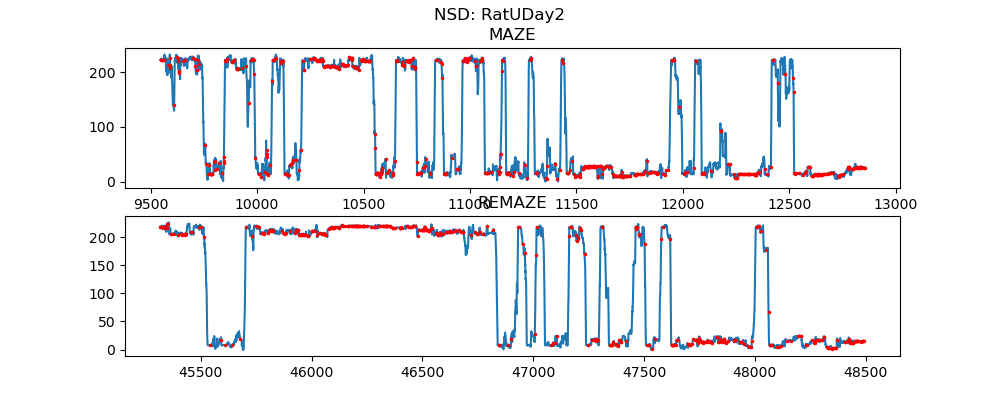

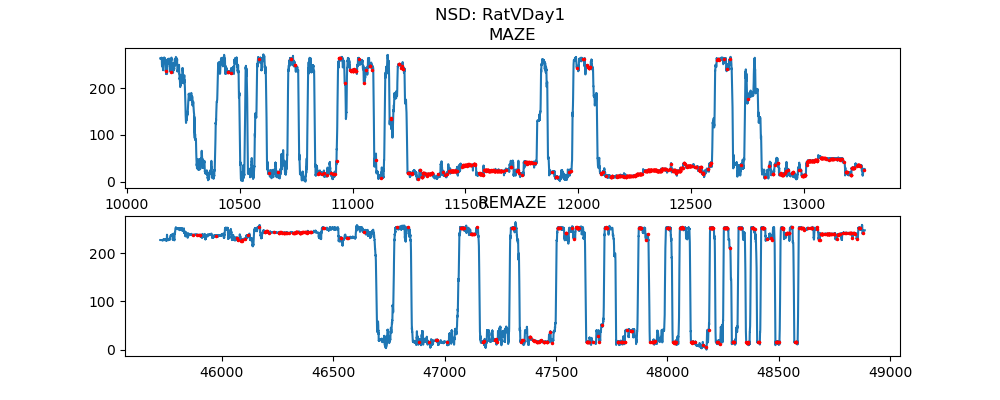

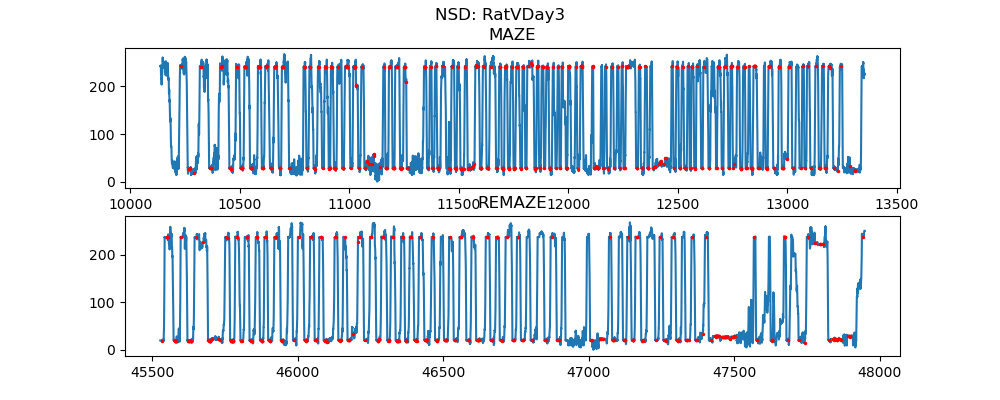

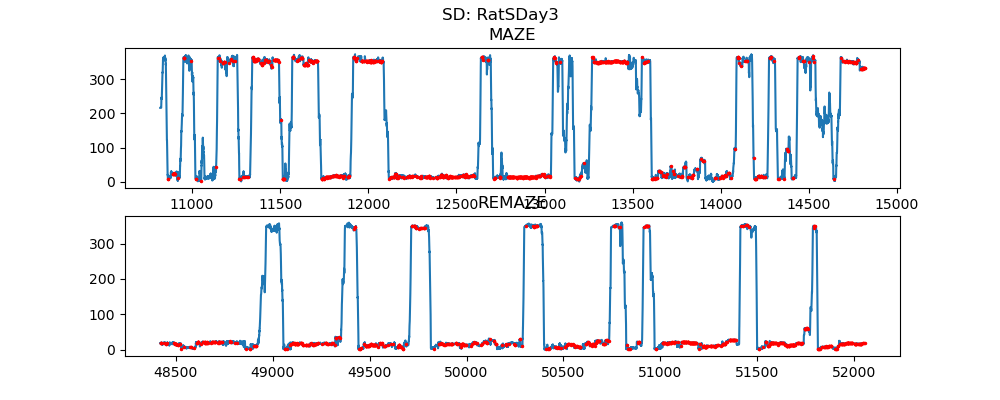

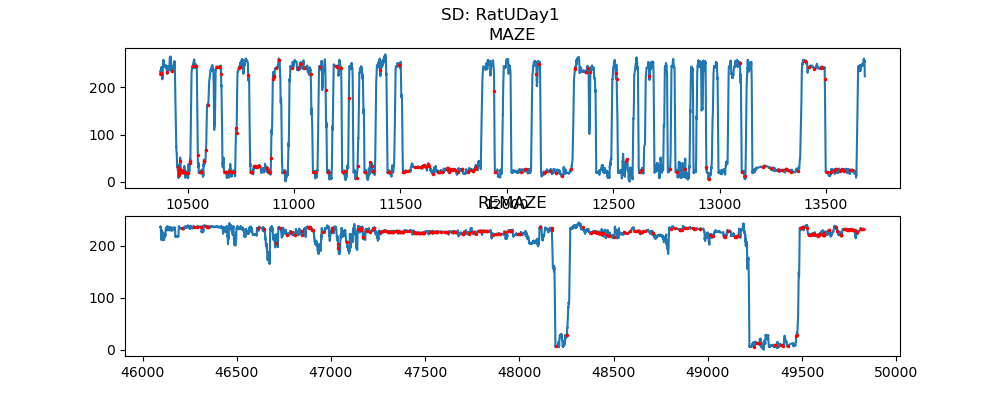

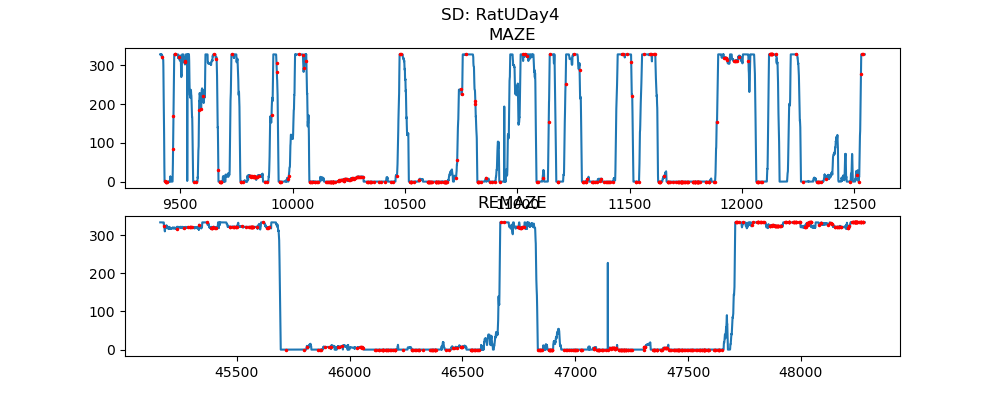

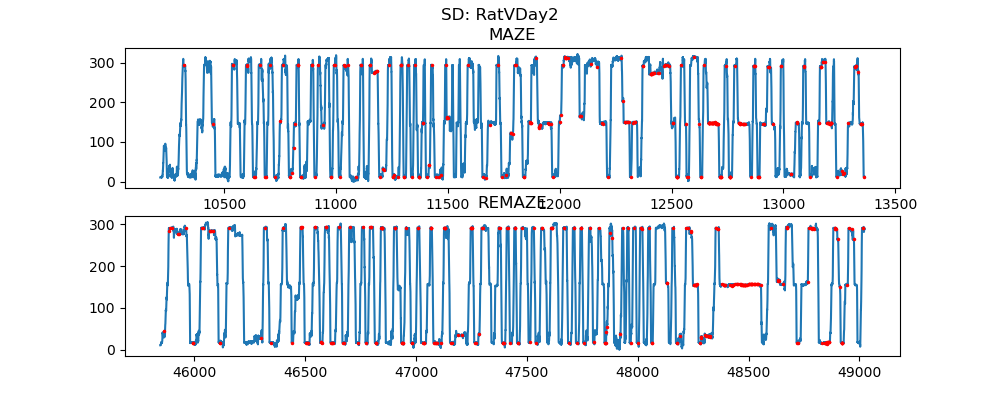

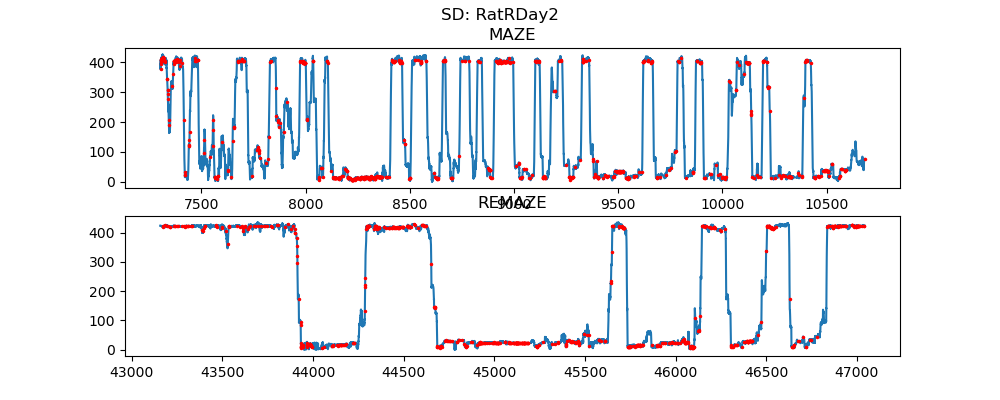

In [9]:
rip_thresh = 4  # Use if you only want to look at ripples with peak power above this value
for sess in subjects.remaze_sess()[1:]:
    for tshift_bool in [False, True]:
        tappend = " Manual Time Adjust" if tshift_bool else ""
        fig, ax = plt.subplots(2, 1, figsize=(10, 4))
        fig.suptitle(f"{sess.tag}: {sess.name}{tappend}")

        if tshift_bool:
            tshift_use = {"maze": tshift_dict["maze"][f"{sess.name}{sess.tag}"],
                          "remaze": tshift_dict["remaze"][f"{sess.name}{sess.tag}"]}
        else:
            tshift_use = {"maze": 0, "remaze": 0}
            
        for a, sesh_name in zip(ax, ["maze", "remaze"]):
            plot_traj(sess, sesh_name, tshift_use, a)

        for ids, sesh_name in enumerate(["maze", "re-maze"]):
            pos_use = getattr(sess, "".join(sesh_name.split("-")))
            rip_df = sess.ripple.time_slice(t_start=sess.paradigm[sesh_name].starts[0], 
                                            t_stop=sess.paradigm[sesh_name].stops[0]).to_dataframe()
            rip_df = rip_df[rip_df.peak_power > rip_thresh]
            pos_at_rip = np.interp(rip_df.peak_time.values, pos_use.time, pos_use.x)
            ax[ids].plot(rip_df.peak_time.values, pos_at_rip, 'r.', markersize=3)

In [ ]:
_, axs = plt.subplots(2, 2, width_ratios=(4, 1), figsize=(12, 5))
ax = axs[:, 0]
offset = 0
sess = sessions[id]

pos_at_ttls = np.interp(approx_maze_start_rec_time + maze_ttl_ts / 30000 + offset, sess.maze.time, sess.maze.x)

ax[0].plot(sess.maze.time, sess.maze.x)
for idt, (ttl_t, ttl_ch, pos_at_ttl) in enumerate(zip(maze_ttl_ts, np.abs(maze_ttl_chan), pos_at_ttls)):
    col_use = "r" if ttl_ch == 1 else [57/255, 1, 20/255]
    # ax[0].axvline(approx_maze_start_rec_time + ttl_t/ 30000, color=col_use)
    ax[0].plot(approx_maze_start_rec_time + ttl_t/ 30000, pos_at_ttl, '.', color=col_use)
    ax[1].plot(idt, pos_at_ttl, '.', color=col_use)

offsets = np.arange(-3, 3, 0.025)

midpt = sess.maze.x.ptp() / 2
end1_std, end2_std = [], []
for offset_use in offsets:
    pos_at_ttls = np.interp(approx_maze_start_rec_time + maze_ttl_ts / 30000 + offset_use, sess.maze.time, sess.maze.x)
    end1_std.append(pos_at_ttls[pos_at_ttls < midpt].std())
    end2_std.append(pos_at_ttls[pos_at_ttls > midpt].std())

axs[0][1].plot(offsets, end1_std)
axs[1][1].plot(offsets, end2_std)

In [ ]:
sess

In [ ]:
sessions[0].recinfo.write_epochs(sessions[0].ripple, "rpa")

In [ ]:
rec_length_from_csv = 3453.2
print(f"MAZE ephys time = {sessions[id].paradigm['maze'].durations} sec")
rough_pos_start_time = pd.to_datetime("11-05-12", format="%H-%M-%S") + pd.Timedelta(seconds=(rec_length_from_csv - sessions[id].paradigm['maze'].durations[0]) )
rough_pos_start_time

## Check alignment between theta and speed
Eventually we should fold this into a function in `position_util` with inputs of a position class and a signal that is either theta_power or raw signal.

It appears that RatUDay2 and RatUDay4 have some weird stuff going on. Visual inspection of the .eeg indicates that we may have chosen a bad electrode for detecting theta.  Have reselected and need to update - electrodes in SR do NOT exhibit a theta power - speed correlation, and those were in SR most likely. Moving them to just above the cell layer results in clearer peaks.

Next step: adjust both MAZE and reMAZE to the lag that has the best correlation with theta.

PROBLEM: Some rats (e.g. RatU) barely move during reMAZE, so it's hard to get a good correlation when so few data points have a large velocity...maybe only look at certain running epochs with a 2 second buffer on either side?

In [ ]:
sess = sessions[3]
# Specify theta params
theta_params = {'freq_band': (5, 12),
                'thresh': (0, None),
                'edge_cutoff': -0.25,
                'mindur': 0.25,
                'maxdur': None,
                'sigma': 0.125}

# Get EEG signal from best theta channel
eegtheta_file = sorted(sess.recinfo.dat_filename.parent.glob("*_thetachan.eeg"))[0]
sess.thetachan_eeg = BinarysignalIO(eegtheta_file, n_channels=1, sampling_rate=sess.recinfo.eeg_sampling_rate)
theta_sig = sess.thetachan_eeg.get_signal()

# Get theta power epochs
theta_epochs, theta_power = detect_theta_epochs(theta_sig, ignore_epochs=sess.artifact, return_power=True, **theta_params)

In [ ]:
sess.paradigm
wake_times_only = True
_, ax = plt.subplots(1, 4, figsize=(10, 3))
for a, tpoint in zip(ax, ['pre', 'maze', 'post', 're-maze']):
    if wake_times_only:
        epochs_use = sess.paradigm[tpoint].intersection(sess.brainstates.label_slice(["QW", "AW"]))
    else:
        epochs_use = sess.paradigm[tpoint]
    tbool = (theta_sig.time > epochs_use.starts[0]) & (theta_sig.time < epochs_use.stops[0])
    theta_power_slice = theta_power[tbool]
    a.hist(theta_power_slice, 100)
    a.axvline(np.mean(theta_power_slice), color='r')
    a.set_title(tpoint)
    

In [ ]:
tpoint = 'remaze'
getattr(sess, tpoint)

### Get Cross-correlation between speed and theta power to id if re-alignment is necessary

#### Plot speed vs theta power cross-correlations with different parameters
Then create t_shift dictionary by hand.  1 cm/sec threshold looks good (too many 0 cm/sec points in a few remaze sessions makes it impossible to align without thresholding).

In [ ]:
from copy import deepcopy
from neuropy.plotting.signals import plot_signal_w_epochs
from neuropy.core.signal import Signal
pos_smooth_sigma = 0.1
plot_signal = False
speed_thresh_for_corr_list = [1] # [0, 1, 2, 4, 10]  # Set to [1] to get best prediction of alignment, set to [0, 1, 2, 4, 10] to plot at different speed thresholds
t_range = (-2, 2)

# Specify theta params
theta_params = {'freq_band': (5, 12),
                'thresh': (0, None),
                'edge_cutoff': -0.25,
                'mindur': 0.25,
                'maxdur': None,
                'sigma': 0.125}

ax_maze, ax_remaze, fig_maze, fig_remaze = [], [], [], []
for idst, speed_thresh_for_corr in enumerate(speed_thresh_for_corr_list):
    for idt, tpoint in enumerate(['maze', 'remaze']):
        fig, ax = plt.subplots(3, 3, layout='tight')
        fig.suptitle(tpoint.upper())

        if tpoint == 'maze':
            ax_maze.append(ax)
            fig_maze.append(fig)
        else:
            ax_remaze.append(ax)
            fig_remaze.append(fig)

ax_all = np.array([ax_maze, ax_remaze])
fig_all = np.array([fig_maze, fig_remaze])

t_shift_dict = {"maze": {}, "remaze": {}}
for ids, sess in enumerate(sessions):
    
     # Get EEG signal from best theta channel
    eegtheta_file = sorted(sess.recinfo.dat_filename.parent.glob("*_thetachan.eeg"))[0]
    sess.thetachan_eeg = BinarysignalIO(eegtheta_file, n_channels=1, sampling_rate=sess.recinfo.eeg_sampling_rate)
    theta_sig = sess.thetachan_eeg.get_signal()
    

    
    # power_bool = (theta_sig.time > pos_use.t_start) & (theta_sig.time < pos_usee.t_stop)

    for idt, tpoint in enumerate(['maze', 'remaze']):

        # Get position data to use
        pos_use = getattr(sess, tpoint)
        
        # Get position data and smooth
        pos_smooth = pos_use.get_smoothed(pos_smooth_sigma)

        # Get theta power epochs around each time point
        theta_epochs, theta_power = detect_theta_epochs(theta_sig.time_slice(t_start=pos_use.t_start, t_stop=pos_use.t_stop),
                                                        ignore_epochs=sess.artifact, return_power=True, **theta_params)

        if plot_signal:
            _, ax = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
            plot_signal_w_epochs(theta_sig.time_slice(t_start=pos_use.t_start, t_stop=pos_use.t_stop), 
                                 channel=0, epochs=theta_epochs.time_slice(t_start=pos_use.t_start, t_stop=pos_use.t_stop), ax=ax[0])
    
        for idst, speed_thresh_for_corr in enumerate(speed_thresh_for_corr_list):
            
            fig_use = fig_all[idt, idst]
            a = ax_all[idt, idst].reshape(-1)[ids]
            
            corr_shift = []
            for t_shift in np.arange(t_range[0], t_range[1], 0.05):
                pos_smooth_shift = deepcopy(pos_smooth)
                pos_smooth_shift.t_start = pos_smooth.t_start + t_shift
                speed_interp_shift = np.interp(theta_sig.time_slice(t_start=pos_use.t_start, t_stop=pos_use.t_stop).time,
                                               pos_smooth_shift.time, pos_smooth_shift.speed)
                # corr_shift.append(np.corrcoef(speed_interp_shift, theta_power[power_bool])[0, 1])
                speed_bool = speed_interp_shift > speed_thresh_for_corr
                corr_shift.append(np.corrcoef(speed_interp_shift[speed_bool], theta_power[speed_bool])[0, 1])
        
            t_shift_peak = np.arange(t_range[0], t_range[1], 0.05)[np.argmax(corr_shift)]
            # t_shift_all.append(t_shift_peak)
            t_shift_dict[tpoint][f"{sess.name}{sess.tag}"] = t_shift_peak
            a.plot(np.arange(t_range[0], t_range[1], 0.05), np.array(corr_shift))
            a.axvline(t_shift_peak, color='r')
            a.set_xlabel("$t_{speed}$ shift (sec)")
            # a.set_ylabel('Speed - Theta Power corr')
            a.set_ylabel(r"$\theta$ - speed corr")
            a.set_title(sess.name)
        
            # fig.savefig(plot_dir / f"Speed_theta_power_xcorrs_{tpoint}_speedthresh{speed_thresh_for_corr}_{np.round(np.abs(t_shift).sum(),0).astype(int)}cm.pdf")
np.save(plot_dir.parent / "Clustering" / "sessions" / f"theta_speed_align_thresh.npy", t_shift_dict, allow_pickle=True)

for idst, speed_thresh_for_corr in enumerate(speed_thresh_for_corr_list):
    for idt, tpoint in enumerate(['maze', 'remaze']):
        # fig, ax = plt.subplots(3, 3, layout='tight')
        t_shift_dict[tpoint] = {}
        fig_use = fig_all[idt, idst]
        fig_use.savefig(plot_dir / f"Speed_theta_power_xcorrs_{tpoint}_speedthresh{speed_thresh_for_corr}_{np.round(np.abs(t_shift).sum(),0).astype(int)}cm.pdf")

### Hand curate time shifts - RatUDay4 bump at +1 second appears arfifactual

In [ ]:
t_shift_dict = {"maze": {}, "remaze": {}}
t_shift_dict['maze'] = {'RatUDay2NSD': -0.4,
                        'RatVDay1NSD': 0.05,
                        'RatVDay3NSD': 0.05,
                        'RatSDay3SD': -0.05,
                        'RatUDay1SD': -0.95,
                        'RatUDay4SD': 0,
                        'RatVDay2SD': 0.05,
                        'RatRDay2SD': -0.15}
t_shift_dict['remaze']= {'RatUDay2NSD': -0.6,
                         'RatVDay1NSD': -0.1,
                         'RatVDay3NSD': 0.1,
                         'RatSDay3SD': 0,
                         'RatUDay1SD': 0.05,
                         'RatUDay4SD': 0,
                         'RatVDay2SD': 0.1,
                         'RatRDay2SD': 0.25}
np.save(plot_dir.parent.parent / "Clustering" / "sessions" / f"theta_speed_align_thresh_hand_vetted.npy", t_shift_dict, allow_pickle=True)